# GLOBAL TERRORISM 

## Introduction


Global terrorism has become one of the rising concerns around the world. Every year, thousands of people become the victims of terrorist attacks. This project aims at understanding the threat level of terrorism and getting an insight into the charateristics and activities of the most dangerous terrorist groups. This project also gives us a deeper understanding of the patterns and trends in terrorist activities in different regions and countries (in particular Iraq), over the years. 

The dataset "Global Terrorism" has been obtained from Kaggle. It is an open-source database which contains information on terrorist incidents from the year 1970-2017 except for the year 1993. It contains more than 170,000 observations. The data includes both numerical and categorical variables. In this project, the analysis is done on terrorist attacks from the year 1987-2017.

**Objectives**
1. To understand the trend and pattern of terrorist activities in the last 30 years. 
1. To find the distribution of terrorist groups in different regions and countries.
1. To find out how effective different terrorist groups are in carrying out their attacks.
1. To make predictions on whether a particular terrorist attack will be successful or not. The term 'success' indicates whether the terrorists were successful in their attempts or not. In the dataset, success = 1, if terrorists were successful in their attempt. Otherwise, success = 0.  
1. To understand how popular the topic global terrorism is at present. Since, the data collected initially contains information only about terrorist attacks till the year 2017, I have streamed live tweets on terrorism via the Twitter streaming API and have done a very brief analysis on them. 

#### The report is divided into four sections:

1. **Data Manipulation**
    1. Importing data
    1. Cleaning data 
1. **Exploratory Data Analysis**
    1. General analysis on terrorist groups and their targets and attacking techniques
    1. Region-wise analysis on terrorist activities 
    1. Country-wise analysis on terrorist activities, with a focus on Iraq 
1. **Predictive Analysis**
    1. Training and Testing data
    1. Random Forests Method
    1. Checking for significant features
1. **Twitter Data Analysis**


### Importing Libraries

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import numpy as np
from collections import OrderedDict
import squarify
from wordcloud import WordCloud
import re
import string
import folium 
from folium.plugins import MarkerCluster 
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

## 1. Data Manipulation

### 1.1 Importing Data
 

In [76]:
# Importing Global Terrorism Data
# Importing split data into single dataframe. (For more details please check read me)
li = []
df = pd.read_csv('data_1.csv', index_col = None, header = 0, encoding = "ISO-8859-1")
li.append(df)

df = pd.read_csv('data_2.csv', index_col = None, header = 0, encoding = "ISO-8859-1")
li.append(df)

df = pd.read_csv('data_3.csv', index_col = None, header = 0, encoding = "ISO-8859-1")
li.append(df)

data_original = pd.concat(li, axis = 0 , ignore_index = True)

data_original.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,2.017100e+11,2017,10,26,NaN,0,NaN,182,Somalia,11,...,NaN,"""Highlights: Somalia Daily Media Highlights 27...",NaN,NaN,START Primary Collection,0,0,0,0,NaN
1,2.017100e+11,2017,10,26,NaN,0,NaN,92,India,6,...,NaN,"""Four injured in grenade attack in Kashmir,"" B...","""5 people wounded in two separate grenade blas...",NaN,START Primary Collection,-9,-9,0,-9,NaN
2,2.017100e+11,2017,10,26,NaN,0,NaN,92,India,6,...,The victims included S.S. Diwiti.,"""CRPF constable injured in grenade attack in J...","""5 people wounded in two separate grenade blas...",NaN,START Primary Collection,-9,-9,0,-9,NaN
3,2.017100e+11,2017,10,26,NaN,0,NaN,123,Mali,11,...,NaN,"""Explosion kills three Chadian UN peacekeepers...","""UN condemns attack against peacekeepers' conv...","""Blast kills 3 UN peacekeepers in Mali,"" Trend...",START Primary Collection,0,1,1,1,NaN
4,2.017100e+11,2017,10,26,NaN,0,NaN,69,France,8,...,NaN,"""Cars Torched in Attack on French Police Housi...","""Europe News Highlights 2 November 2017,"" Summ...","""French Prosecutor: Arson Attack on Gendarmes'...",START Primary Collection,-9,-9,0,-9,NaN


In [ ]:
# Getting twitter data 
import settings
import tweepy
import dataset
from textblob import TextBlob
from sqlalchemy.exc import ProgrammingError
import json

db = dataset.connect(settings.CONNECTION_STRING)

class StreamListener(tweepy.StreamListener):

    def on_status(self, status):
        if status.retweeted:
            return

        description = status.user.description
        loc = status.user.location
        text = status.text
        coords = status.coordinates
        geo = status.geo
        name = status.user.screen_name
        user_created = status.user.created_at
        followers = status.user.followers_count
        id_str = status.id_str
        created = status.created_at
        retweets = status.retweet_count
        bg_color = status.user.profile_background_color
        blob = TextBlob(text)
        sent = blob.sentiment

        if geo is not None:
            geo = json.dumps(geo)

        if coords is not None:
            coords = json.dumps(coords)

        table = db[settings.TABLE_NAME]
        try:
            table.insert(dict(
                user_description=description,
                user_location=loc,
                coordinates=coords,
                text=text,
                geo=geo,
                user_name=name,
                user_created=user_created,
                user_followers=followers,
                id_str=id_str,
                created=created,
                retweet_count=retweets,
                user_bg_color=bg_color,
                polarity=sent.polarity,
                subjectivity=sent.subjectivity,
            ))
        except ProgrammingError as err:
            print(err)

    def on_error(self, status_code):
        if status_code == 420:
            #returning False in on_data disconnects the stream
            return False

auth = tweepy.OAuthHandler(settings.TWITTER_APP_KEY, settings.TWITTER_APP_SECRET)
auth.set_access_token(settings.TWITTER_KEY, settings.TWITTER_SECRET)
api = tweepy.API(auth)

stream_listener = StreamListener()
stream = tweepy.Stream(auth=api.auth, listener=stream_listener)
stream.filter(track=settings.TRACK_TERMS)

In [6]:
twitter_data = pd.read_csv('twitter_data.csv')
twitter_data.head()

,id,user_description,user_location,coordinates,text,geo,user_name,user_created,user_followers,id_str,created,retweet_count,user_bg_color,polarity,subjectivity
0,1,Giovanni Benavides Licensed Mental Health Coun...,"Brooklyn, NY",NaN,RT @RealBlue75: Fucking snowflakes. When I was...,NaN,seterapia,2011-10-30 18:04:37.000000,4254,1219316211223355392,2020-01-20 17:50:13.000000,0,000000,-0.200000,0.283333
1,2,enough is enough.,NaN,NaN,@AmericanDad757 @WakeUpCanada1 Peaceful people...,NaN,truth02185825,2019-11-04 14:25:50.000000,10,1219316211181346817,2020-01-20 17:50:13.000000,0,F5F8FA,0.250000,0.500000
2,3,NaN,NaN,NaN,@realDonaldTrump I'll keep saying this if you ...,NaN,AgulueG,2020-01-01 00:13:02.000000,2,1219316211714002959,2020-01-20 17:50:13.000000,0,F5F8FA,0.400000,0.800000
3,4,I retweet stuff mostly. #IamBreitbart #IStandW...,"Houston, TX area",NaN,RT @ScottPresler: I came out as gay after the ...,NaN,Daniel__78,2009-10-28 10:21:02.000000,830,1219316212552724480,2020-01-20 17:50:13.000000,0,131516,0.416667,0.583333
4,5,I am old and pissed off. I hate liberals. My s...,NaN,NaN,"RT @CalebJHull: It's 22 degrees in Richmond, V...",NaN,hank_balls,2020-01-14 19:40:46.000000,2,1219316212464787456,2020-01-20 17:50:13.000000,0,F5F8FA,0.500000,0.500000


### 1.2 Cleaning Data

In order to clean the data, the following steps have been followed-
1. Removal of unwanted columns from the dataset as they are not required in the study.
1. Some of the columns have been renamed for better understanding.
1. Missing values are found and either removed or replaced.
1. Duplicates are found and removed.

#### a) Global Terrorism Data

In [77]:
# Getting data for years 1987-2017
data_original['iyear'] = data_original['iyear'] .astype(int)
data = data_original.loc[data_original['iyear'] > 1986] 

# Selecting column we need for analysis
data = data[['iyear', 'imonth', 'iday', 'extended', 'country_txt', 'region_txt', 'city', 'latitude', 'longitude', 'crit1', 
            'crit2','crit3','multiple', 'success', 'suicide', 'attacktype1_txt','attacktype1', 'targtype1_txt','targtype1', 'natlty1_txt', 
             'gname', 'weaptype1_txt', 'weaptype1','nkill', 'nwound', 'property', 'ishostkid', 'doubtterr']]

# Renaming column for better understanding
data.rename(columns = {'iyear':'year','imonth':'month','iday':'day','country_txt':'country',
                       'region_txt':'region','attacktype1_txt':'attack_type','targtype1_txt':'target_type',
                       'gname':'group_name','natlty1_txt':'victim_nationality','weaptype1_txt':'weapon_type',
                       'nkill':'killed','nwound':'wounded','ishostkid':'hostage'},inplace = True)

# Adding a column for casualities
data['casualities'] = data['killed'] + data['wounded']
data.head()

,year,month,day,extended,country,region,city,latitude,longitude,crit1,...,victim_nationality,group_name,weapon_type,weaptype1,killed,wounded,property,hostage,doubtterr,casualities
0,2017,10,26,0,Somalia,Sub-Saharan Africa,Saakow district,1.642087,42.453281,1,...,Somalia,Al-Shabaab,Other,12,1.0,0.0,0,1.0,0.0,1.0
1,2017,10,26,0,India,South Asia,Damhal Hanjipora,33.620945,74.924266,1,...,India,Unknown,Explosives,6,0.0,4.0,-9,0.0,0.0,4.0
2,2017,10,26,0,India,South Asia,Tral,33.931011,75.114212,1,...,India,Unknown,Explosives,6,0.0,1.0,-9,0.0,0.0,1.0
3,2017,10,26,0,Mali,Sub-Saharan Africa,Unknown,19.525008,0.880573,1,...,International,Jamaat Nusrat al-Islam wal Muslimin (JNIM),Explosives,6,3.0,2.0,1,0.0,0.0,5.0
4,2017,10,26,0,France,Western Europe,Meylan,45.214047,5.794780,1,...,France,Feminist extremists,Incendiary,8,0.0,0.0,1,0.0,0.0,0.0


In [78]:
# Removing rows for which doubterr is not equal to 0. 
# Here, if doubterr = 0 then the attack was a terrorist attack for sure.
data = data[data.doubtterr == 0]

# Replacing all NaN with 0 for killed,wounded and casualities 
data['killed'].fillna(0, inplace = True)
data['wounded'].fillna(0, inplace = True)
data['casualities'].fillna(0, inplace = True)
data.head()

,year,month,day,extended,country,region,city,latitude,longitude,crit1,...,victim_nationality,group_name,weapon_type,weaptype1,killed,wounded,property,hostage,doubtterr,casualities
0,2017,10,26,0,Somalia,Sub-Saharan Africa,Saakow district,1.642087,42.453281,1,...,Somalia,Al-Shabaab,Other,12,1.0,0.0,0,1.0,0.0,1.0
1,2017,10,26,0,India,South Asia,Damhal Hanjipora,33.620945,74.924266,1,...,India,Unknown,Explosives,6,0.0,4.0,-9,0.0,0.0,4.0
2,2017,10,26,0,India,South Asia,Tral,33.931011,75.114212,1,...,India,Unknown,Explosives,6,0.0,1.0,-9,0.0,0.0,1.0
3,2017,10,26,0,Mali,Sub-Saharan Africa,Unknown,19.525008,0.880573,1,...,International,Jamaat Nusrat al-Islam wal Muslimin (JNIM),Explosives,6,3.0,2.0,1,0.0,0.0,5.0
4,2017,10,26,0,France,Western Europe,Meylan,45.214047,5.794780,1,...,France,Feminist extremists,Incendiary,8,0.0,0.0,1,0.0,0.0,0.0


In [79]:
# Finding missing Values
data.isna().sum()

year                     0
month                    0
day                      0
extended                 0
country                  0
region                   0
city                   394
latitude              1998
longitude             1998
crit1                    0
crit2                    0
crit3                    0
multiple                 1
success                  0
suicide                  0
attack_type              0
attacktype1              0
target_type              0
targtype1                0
victim_nationality    1244
group_name               0
weapon_type              0
weaptype1                0
killed                   0
wounded                  0
property                 0
hostage                  5
doubtterr                0
casualities              0
dtype: int64

In [80]:
# Dropping the rows with missing values
df = data.dropna()

In [81]:
# Finding duplicates
duplicates = df.duplicated()
duplicates

0         False
1         False
2         False
3         False
4         False
5         False
6         False
8         False
9         False
10        False
11        False
12        False
13        False
14        False
15        False
16        False
17        False
18        False
19        False
20        False
21        False
22        False
23        False
25        False
26        False
27        False
28        False
29        False
30        False
31        False
          ...  
181660    False
181661    False
181662    False
181663    False
181664    False
181665    False
181666    False
181667    False
181668    False
181669    False
181670    False
181672    False
181673    False
181674    False
181675    False
181676    False
181677    False
181678    False
181679    False
181680    False
181681    False
181682    False
181683    False
181684    False
181685    False
181686    False
181687    False
181688    False
181689    False
181690    False
Length: 115380, dtype: b

In [82]:
# Dropping duplicates
df = df.drop_duplicates()

In [83]:
df.head()

,year,month,day,extended,country,region,city,latitude,longitude,crit1,...,victim_nationality,group_name,weapon_type,weaptype1,killed,wounded,property,hostage,doubtterr,casualities
0,2017,10,26,0,Somalia,Sub-Saharan Africa,Saakow district,1.642087,42.453281,1,...,Somalia,Al-Shabaab,Other,12,1.0,0.0,0,1.0,0.0,1.0
1,2017,10,26,0,India,South Asia,Damhal Hanjipora,33.620945,74.924266,1,...,India,Unknown,Explosives,6,0.0,4.0,-9,0.0,0.0,4.0
2,2017,10,26,0,India,South Asia,Tral,33.931011,75.114212,1,...,India,Unknown,Explosives,6,0.0,1.0,-9,0.0,0.0,1.0
3,2017,10,26,0,Mali,Sub-Saharan Africa,Unknown,19.525008,0.880573,1,...,International,Jamaat Nusrat al-Islam wal Muslimin (JNIM),Explosives,6,3.0,2.0,1,0.0,0.0,5.0
4,2017,10,26,0,France,Western Europe,Meylan,45.214047,5.794780,1,...,France,Feminist extremists,Incendiary,8,0.0,0.0,1,0.0,0.0,0.0


"df" is the final dataset which is obtained after removing missing values and duplicates, it will be used in the analysis below. 

#### Some of the variables explained
1. Extended - if the duration of incident lasted more than 24 hours then extended = 1, else extended = 0
1. crit1 - if the pupose of the attack was to attain political, economic, religious, or social goal then crit1 = 1, else crit1 = 0 .
1. crit2 - if the pupose of the attack was to coerce, intimidate or publicise tolarher audience then crtie2 = 1, else crit2 = 0.
1. crit3 - if the action is outside the context of legitimate warfare activities then crit3 = 1, else crit3 = 0.
1. suicide - if it was a suicide attack then suicide = 1, else suicide = 0.
1. doubterr - if there is doubt as to whether the incident is an act of terrorism then doubterr = 1, else doubterr = 1. multiple - if the attack is a part of multiple attack then multiple = 1, else multiple = 0.
1. killed - number of people killed


#### b) Twitter Data

In [14]:
# Removing unwanted columns
twitter_df = twitter_data.drop(['geo','user_name','user_created','user_followers','id_str','created','retweet_count',
                              'user_bg_color','polarity','subjectivity','user_location','coordinates'],axis=1) 
twitter_df.head()

,id,user_description,text
0,1,Giovanni Benavides Licensed Mental Health Coun...,RT @RealBlue75: Fucking snowflakes. When I was...
1,2,enough is enough.,@AmericanDad757 @WakeUpCanada1 Peaceful people...
2,3,NaN,@realDonaldTrump I'll keep saying this if you ...
3,4,I retweet stuff mostly. #IamBreitbart #IStandW...,RT @ScottPresler: I came out as gay after the ...
4,5,I am old and pissed off. I hate liberals. My s...,"RT @CalebJHull: It's 22 degrees in Richmond, V..."


In [64]:
# Removing unwanted characters like '@', '/', '\' etc. from the dataset 
def remove_characters(words):
    characters_regex    = re.compile('((https?):((//)|(\\\\))+([\w\d:#@%/;$()~_?\+-=\\\.&](#!)?)*)', re.DOTALL)
    characters         = re.findall(characters_regex, words)
    for character in characters:
        words = words.replace(character[0], ', ')    
    return words

def remove_all_characters(words):
    unit_prefixes = ['@','#']
    for i in  string.punctuation:
        if i not in unit_prefixes :
            words = words.replace(i,' ')
    texts = []
    for text in words.split():
        text = text.strip()
        if text:
            if text[0] not in unit_prefixes:
                texts.append(text)
    return ' '.join(texts)

tweet_texts = list(twitter_df.text)

# Creating a list of tweets which will be used later. 
tweet_txt = []
for t in tweet_texts:
    tweet_txt.append(remove_all_characters(remove_characters(t)))

## 2. Exploratory Data Analysis

This section is divided into three parts -
1. General analysis on terrorist incidents which includes study on main targets of terrorists, their attacking techniques and most lethal terror groups.
1. Region-wise analysis on terrorist incidents
1. Country-wise analysis on terrorist incidents with a detailed study of attacks in Iraq.

This part of the report consists of different data visualisation techniques like bar chart, donut plot, pie chart, tree plot, heat map, etc.,  to analyse our data. 

### 2.1 General analysis on terrorist groups and their targets and attacking techniques

#### a) Terrorist attack every year

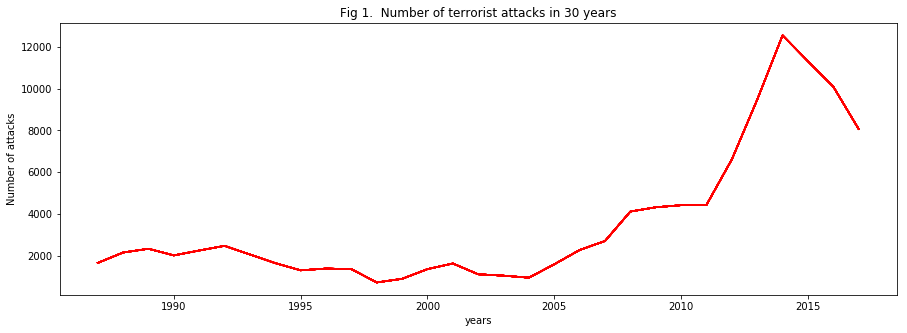

In [16]:
# Setting figure size
plt.subplots(figsize = (15,5))

# Plotting the graph
plt.plot(df.groupby(['year']).count().index, df.groupby(['year']).count(),color="r")

# Setting titles and labels
plt.title("Fig 1.  Number of terrorist attacks in 30 years")
plt.xlabel("years")
plt.ylabel("Number of attacks")
plt.show()

From the above graph we can make the following observations-
1. Number of attacks was minimum in the year 1998 and maximum in 2014.
1. Numer of terrorist attacks have risen sharply in 2000s.
1. There has been a continuous increase in terrorist attacks since 2004 till 2014 and then there is a decline in the next 3 years.
1. The number of attacks was as low as 1000 in 1998 and as high as around 13000 in 2014. This shows a dramatic increase in the number of terrorist attacks. 

#### Folium map for the year 2014, since this was the year which had maximum attacks

In [72]:
# Getting the count of attacks for the year 2014
get_year = df['year'] == 2014
get_data = df[get_year]
get_data = get_data.loc[:,'city':'longitude'] 
data_list = get_data.values.tolist()

# Plotting folium map
map = folium.Map(location = [0, 20], tiles='CartoDB positron',zoom_start=3)
mcluster = folium.plugins.MarkerCluster().add_to(map)
for i in range(0, len(data_list)):
    folium.Marker(location=[data_list[i][1],data_list[i][2]], popup = data_list[i][0]).add_to(mcluster)
map

The above map represents that most of the attacks happened in Middle East region of the world in 2014. 

#### b) Main targets of terrorists 

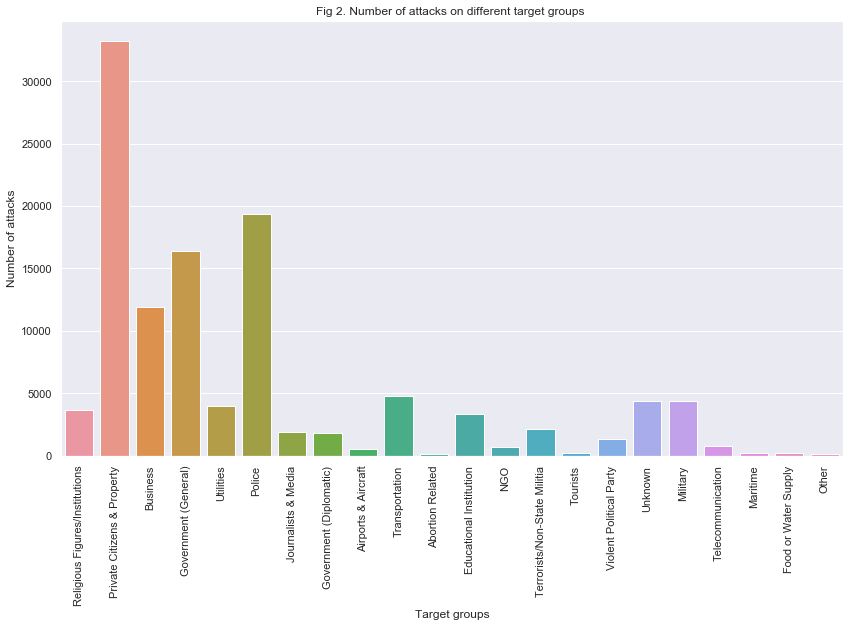

In [149]:
# Setting figure size
plt.subplots(figsize = (14,8))

# Setting the background colour of the graph
sns.set(style = "darkgrid")

# Using sns.countplot to plot the number of attacks 
sns.countplot(x = "target_type", data=df)

# Rotating the x axis labels
plt.xticks(rotation = 90)

# Setting titles and labels
plt.title("Fig 2. Number of attacks on different target groups ")
plt.xlabel("Target groups")
plt.ylabel("Number of attacks")
plt.show()

From the above figure it looks like Private Citizens and Property are the favourite targets of terrorists. Apart from these, police, government and business are also among the most targeted groups. 

#### c) Attacking techniques used by terrorists

Text(0.5, 1.0, 'Fig 3. proportion of attacking techniques used by terrorists')

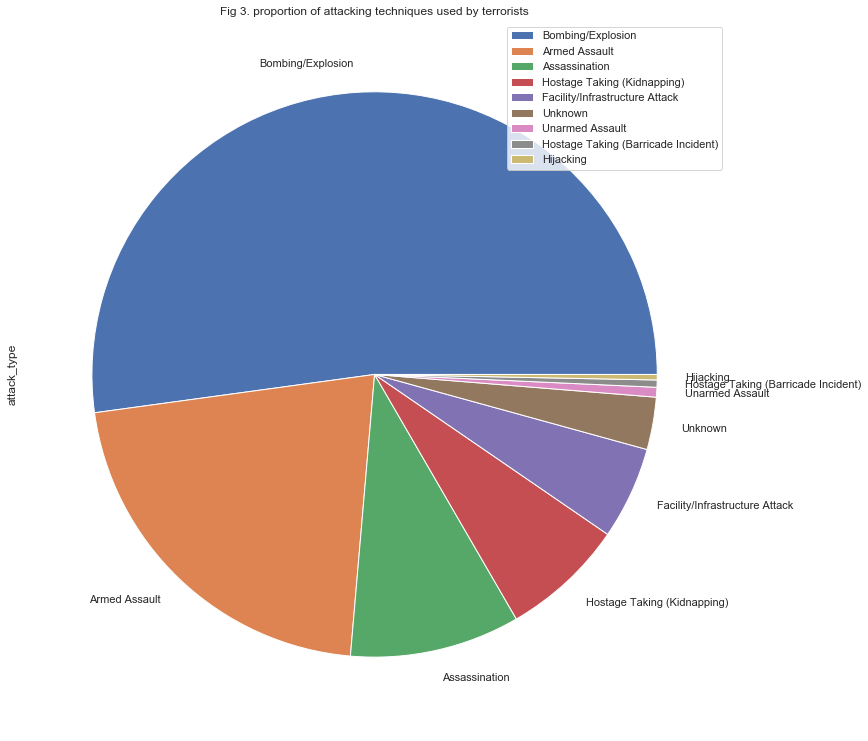

In [78]:
# Plotting pie chart
pie_chart = pd.DataFrame(df["attack_type"])
pie_chart.apply(pd.value_counts).plot.pie(subplots = True, figsize = (13, 13))

# Setting the title
plt.title("Fig 3. proportion of attacking techniques used by terrorists")


From **Fig 3.** it is observed that Bombing/Explosion and Armed Assault are the most used attacking techniques by terrorists around the globe. Assassination and Kidnapping are also used to create terror among the people around the world. Hijacking, Unarmed Assault, Barricade Incidents are among the least used attacking techniques by terrorists. 

#### d) Number of casualities due to different attacking methods

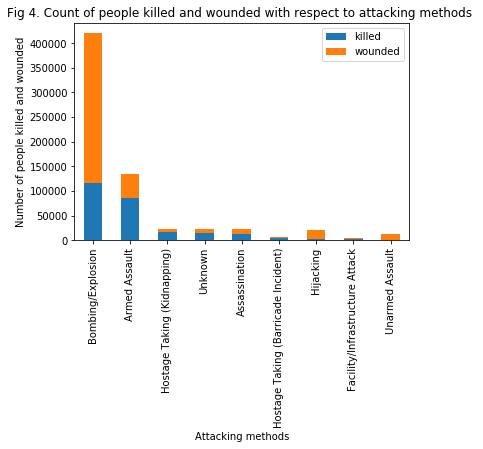

In [134]:
# Finding the number of people killed every year
attack_killed = df.groupby('attack_type')['killed'].sum()

# Finding the number of people wounded every year
attack_wounded = df.groupby('attack_type')['wounded'].sum()

# Stack plot of number of people killed and wounded
graph = pd.concat([attack_killed, attack_wounded], axis = 1).sort_values(by = 'killed', ascending = False)
graph.plot.bar(stacked = True)

#Setting titles and labels
plt.title("Fig 4. Count of people killed and wounded with respect to attacking methods ")
plt.xlabel("Attacking methods")
plt.ylabel("Number of people killed and wounded")
plt.show()


It is observed that, maximum number of people are killed and wounded in case of Bombings/Explosions, this is followed by high number of casualities due to Armed Assaults. This could be one of the major reasons which explains why these two attacking methods are used the most by terrorists as depicted in **Fig 3.** as they lead to more casualities and fear among the general public. 

#### e) Most active terrorists groups

The most active terrorist groups refers to those terrorist groups which have caused maximum number of attacks over the last 30 years and continue to do so.

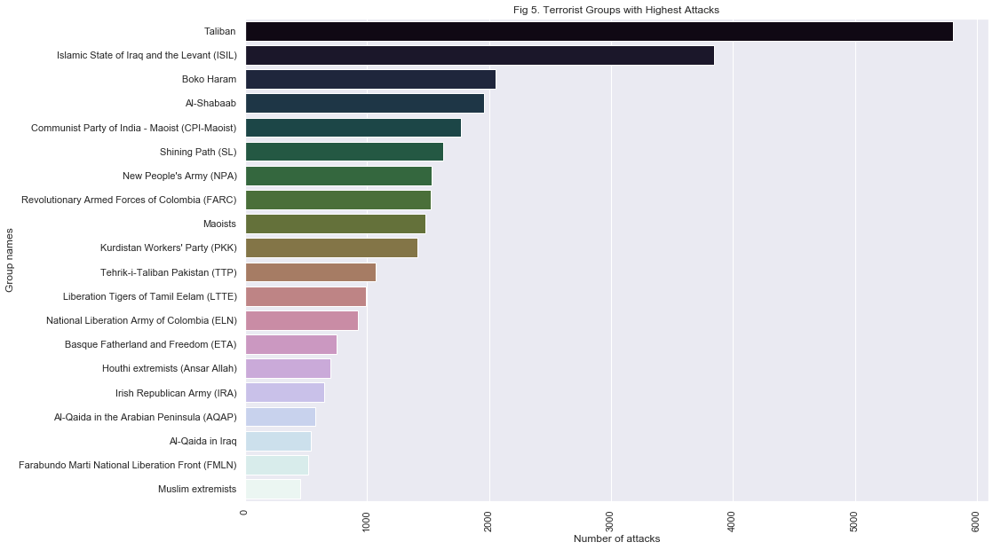

In [393]:
# Setting the fiigure size
plt.subplots(figsize = (15,10))

# Plotting the Bar chart
sns.barplot(df['group_name'].value_counts()[1:21].values,df['group_name'].value_counts()[1:21].index,palette = "cubehelix")

# Setting title and labels
plt.xticks(rotation = 90)
plt.title('Fig 5. Terrorist Groups with Highest Attacks')
plt.xlabel('Number of attacks')
plt.ylabel('Group names')
plt.show()

**Fig 5.** represents the most active terrorists groups in the world. From the above figure we can see that Taliban  is the most active terrorist groups, followed by Islamic State of Iraq and the Levant(ISIL). Taliban and ISIL have been involved in more than 5000 and 4000 attacks respectively. It can be observed that only 11 groups have led to more than 1000 attacks. These terrorist groups are - Taliban, ISIL, Al-Shabaab, NPA, PKK, SL, CPI-Maoist, FARC, Boko Haram, Maoists and TTP. 

#### f) Deep dive analysis of terrorism distribution

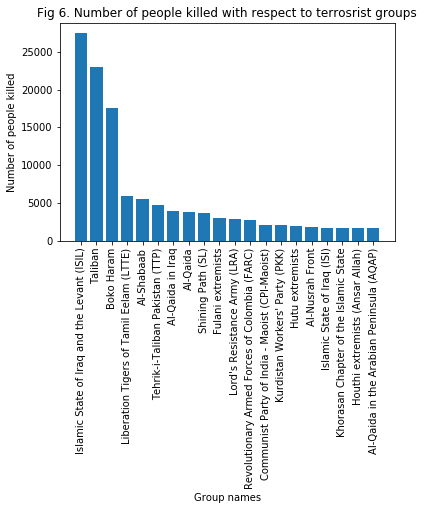

258067.0

In [28]:
# Finding number of people killed by different terrorist groups
attack_killed = df.groupby('group_name')['killed'].sum()
a_k = attack_killed.sort_values(ascending = False)

# Finding top 20 terrorist groups which killed maximum people
a_k1 = a_k[1:21]

# Converting it into dictionry
a_k2 = dict(a_k1)

# Plotting the above dictionary 
plt.bar(*zip(*a_k2.items()))
plt.xticks(rotation = 90)

# Setting title and labels
plt.title("Fig 6. Number of people killed with respect to terrosrist groups")
plt.xlabel("Group names")
plt.ylabel("Number of people killed")
plt.show()

# Finding total number of people killed in all the attacks
sum(a_k)



**Fig 6.** gives us an insight into the number of people that have been killed by top 20 terrorist group. This tells us something very interesting - even though the number of attacks by ISIL is less than Taliban, it has killed more number of people as compared to Taliban. This is the case with many other terror groups. For example, some of the other groups like  LTTE have killed much more people than groups like TTP and PKK, although their number of attacks was less than that of the latter.


The above number represents that 258,067 people have been killed by terrorists between 1987 and 2017. This is an enormous number of deaths. 

Based on the findings from **Fig 5.** and **Fig 6.** I have formed a metric below to calculate which terrrorist groups are very effective. Here, I have defined the efectiveness of terrorist as the ratio of number of people killed and number of attacks by the respective terrorist groups. So, if a terrorist group manages to kill more number of people with less number of attacks, then it is found to be very effective. I have found the effectiveness of only those terrorist groups which have attacked more than 1000 times. 

In [41]:
#METRIC TO FIND THE EFFECTIVENESS OF TERRORIST GROUPS

# Groups 
group_attack = df['group_name'].value_counts()[1:12]
group_killed = df.groupby('group_name')['killed'].sum()
group_killed = group_killed.sort_values(ascending = False)
group_killed = group_killed[1:]

# Making dictionary with keys as group names and value as number of attacks carried out by those groups
group_attack_dict = dict(group_attack)


# Making dictionary with keys as group names and value as number of people killed
group_killed_dict = dict(group_killed)

# Getting a set of above two dictionaries
a = set(group_attack_dict)
b = set(group_killed_dict)

dict1 = {}
for key in a:
    if key in b:
        dict1[key] = group_killed_dict[key]
dict1

# Finding the ratio of number of people killed and number of attacks
dict2 = dict((k,float(dict1[k])/group_attack_dict[k]) for k in group_attack_dict)



#sorting the above dictionary
dict2_sorted_keys = sorted(dict2, key = dict2.get, reverse = True)
for i in dict2_sorted_keys:
    print(i, dict2[i])



Boko Haram 8.552362396492937
Islamic State of Iraq and the Levant (ISIL) 7.129124447908548
Tehrik-i-Taliban Pakistan (TTP) 4.420560747663552
Taliban 3.9638242894056845
Al-Shabaab 2.8057259713701432
Shining Path (SL) 2.272167487684729
Revolutionary Armed Forces of Colombia (FARC) 1.7540983606557377
Kurdistan Workers' Party (PKK) 1.449645390070922
Communist Party of India - Maoist (CPI-Maoist) 1.1954802259887005
New People's Army (NPA) 0.9508840864440079
Maoists 0.8523035230352304


The above result shows that Boko Haram and Islamic State of Iraq and the Levant (ISIL) are among the most effective terrorist groups as they have managed to kill more number of people with fewer attacks as compared to the other groups. This is followed by Tehrik-i-Taliban Pakistan (TTP) and Taliban, which are also quite effective. 

#### g) Trend in activities of terrorist groups with respect to years

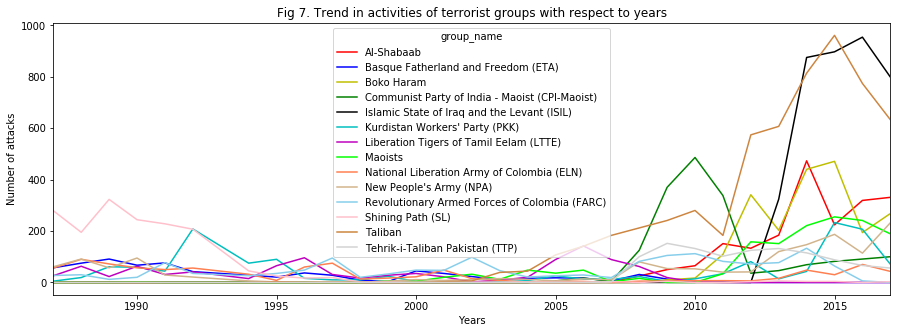

In [29]:
# Getting top 14 terrorist groups
terrorist_groups = df[df['group_name'].isin(df['group_name'].value_counts()[1:15].index)]

# Selecting colors
colors = ['r','b','y','g','k','c','m','lime','coral','tan','skyblue','pink','peru','lightgrey']

# Plotting the graph 
x = pd.crosstab(terrorist_groups.year,terrorist_groups.group_name)
x.plot(color = colors)
fig = plt.gcf()

# Setting figure size
fig.set_size_inches(15,5)

# Setting title and labels
plt.title("Fig 7. Trend in activities of terrorist groups with respect to years")
plt.xlabel("Years")
plt.ylabel("Number of attacks")
plt.savefig("Terrorist activities trend.png")
plt.show()

From **Fig 7.** we can make the following observations-
1. Shining Path(SL) was the most active terrorist group till late 1980s. The number of attacks by SL started declining during early 1990s and then it became almost nill in 2000s.
1. Taliban became an active terrorist group only in 2000s. The number of attacks by Taliban has an upperward trend from eary 2000s till 2015.
1. ISIL also known ISIS became active only after 2011. Ever since then, the number of attacks by ISIs has been increasing drastically. ISIL has become more active than Taliban in the recent years, and has killed thousands of people around the world. 
1. **Fig 7.** along with our metric show that ISIL has become one of the most dangerous terrorist groups in the recent years. 

#### h) Suicide attacks over the years

Text(0, 0.5, 'Numer of attacks')

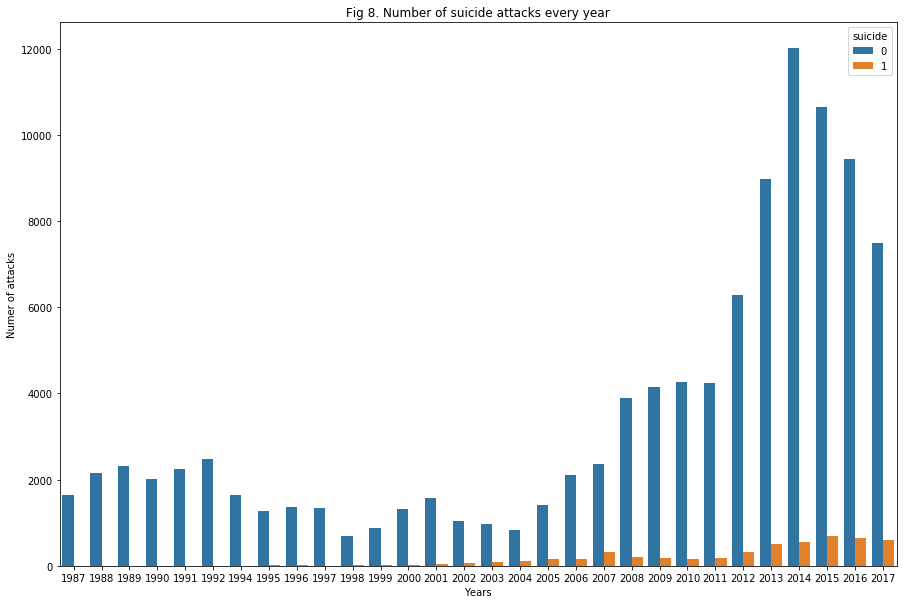

In [30]:
# Setting Figure size
plt.subplots(figsize = (15,10))

#Plotting multple bar diagram
sns.countplot(df.year, hue = df.suicide)

# Setting title and labels
plt.title("Fig 8. Number of suicide attacks every year")
plt.xlabel("Years")
plt.ylabel("Numer of attacks")

It can be seen from **Fig 8.** that suicide attack was not so common till late 1990s. It was only in 2000s that the number of suicide attacks started increasing. Number of suicide attacks was maximum in the year 2015. We can say that suicide attack is a recent development. 

#### i) Casualities over time

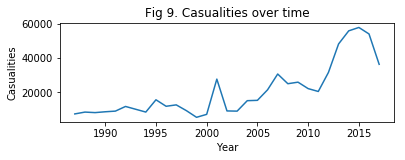

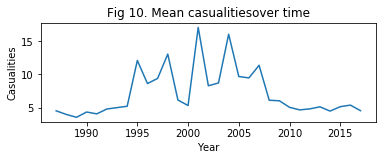

In [31]:
# Plotting casualities over time
diag1 = plt.figure()
ax = diag1.add_subplot(211)
ax.plot(df.groupby('year').count().index,df.groupby('year')['casualities'].sum())
ax.set(title='Fig 9. Casualities over time',xlabel='Year',ylabel='Casualities')

# Plotting average casualities over time
diag2 = plt.figure()
ax1 = diag2.add_subplot(212)
ax1.plot(df.groupby('year').count().index, df.groupby('year')['casualities'].mean())
ax1.set(title='Fig 10. Mean casualitiesover time',xlabel='Year',ylabel='Casualities')

plt.show()

### 2.2 Region-wise terrorist attack analysis 

This section analyses the information obtained from the data with respect to different regions of the world. In this part of the report, we get an in-depth understanding of distribution of terrorist attacks and casualities in different regions of the globe.

#### a) Number of terror attacks 

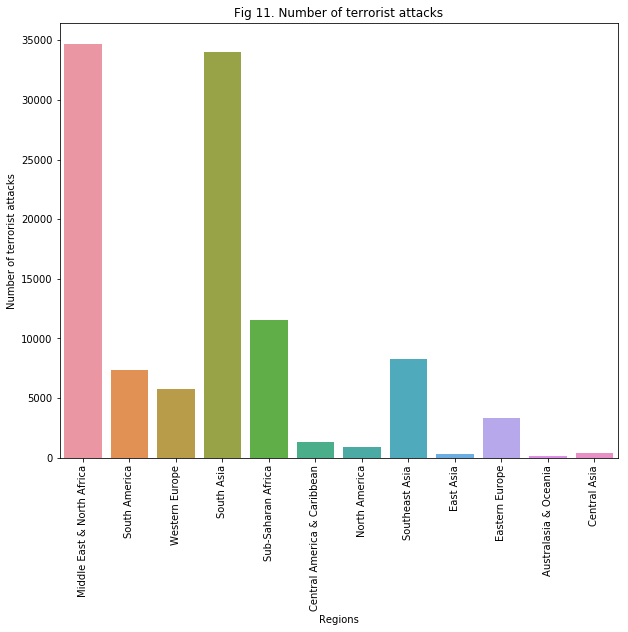

In [32]:
# Selecting plot size
plt.subplots(figsize = (10,8))

# Using sns.countplot to plot the number of attacks in different regions
sns.countplot(df["region"])

# Setting title and labels
plt.title("Fig 11. Number of terrorist attacks")
plt.xticks(rotation = 90)
plt.xlabel('Regions')
plt.ylabel('Number of terrorist attacks')
plt.show()

From **Fig 11.** it is observed that Middle East & North Africa and South Asia are the most attacked regions of the world. However, terrorist groups seem to target Australasia & ceania, Central Asia and East Asia very rarely.


#### b) Trend in terrorist attacks with respect to years

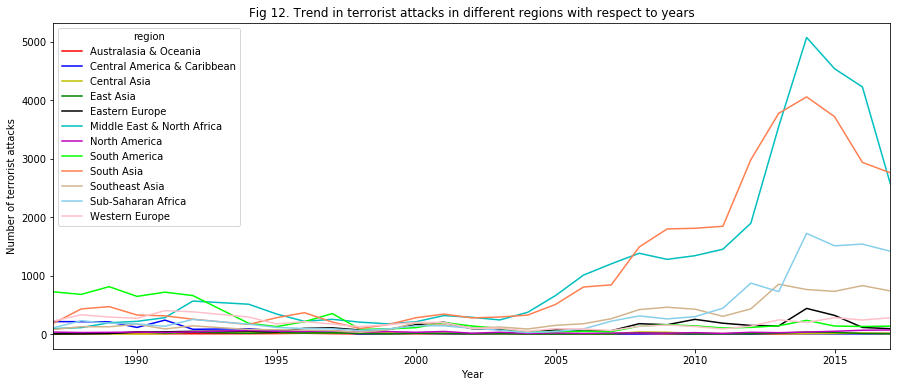

In [33]:
# Selecting colors
colors = ['r','b','y','g','k','c','m','lime','coral','tan','skyblue','pink']

# Plotting the graph 
data_region = pd.crosstab(df['year'],df['region'])
data_region.plot(color = colors)
fig = plt.gcf()

# Setting the size
fig.set_size_inches(15,6)

# Setting title and labels
plt.title('Fig 12. Trend in terrorist attacks in different regions with respect to years')
plt.xlabel('Year')
plt.ylabel('Number of terrorist attacks')
plt.show()

**Fig 12.** represents that South America had the maximum number of attacks till late 1980s and then it started declining in early 1990s. It can also be seen that people of Middle East & North Africe and South Asia became the most frequent victims of terrorist attacks only from early 2000s and continue to be the same. The year 2014, saw maximum number of attacks in almost all the region, though it was the most in Middle East & North Africa.  However, we can observe that there is a small decline in the number of attacks in South Asia and  Middle East & North Africa after 2014. 

#### c) Most active terrorist groups  


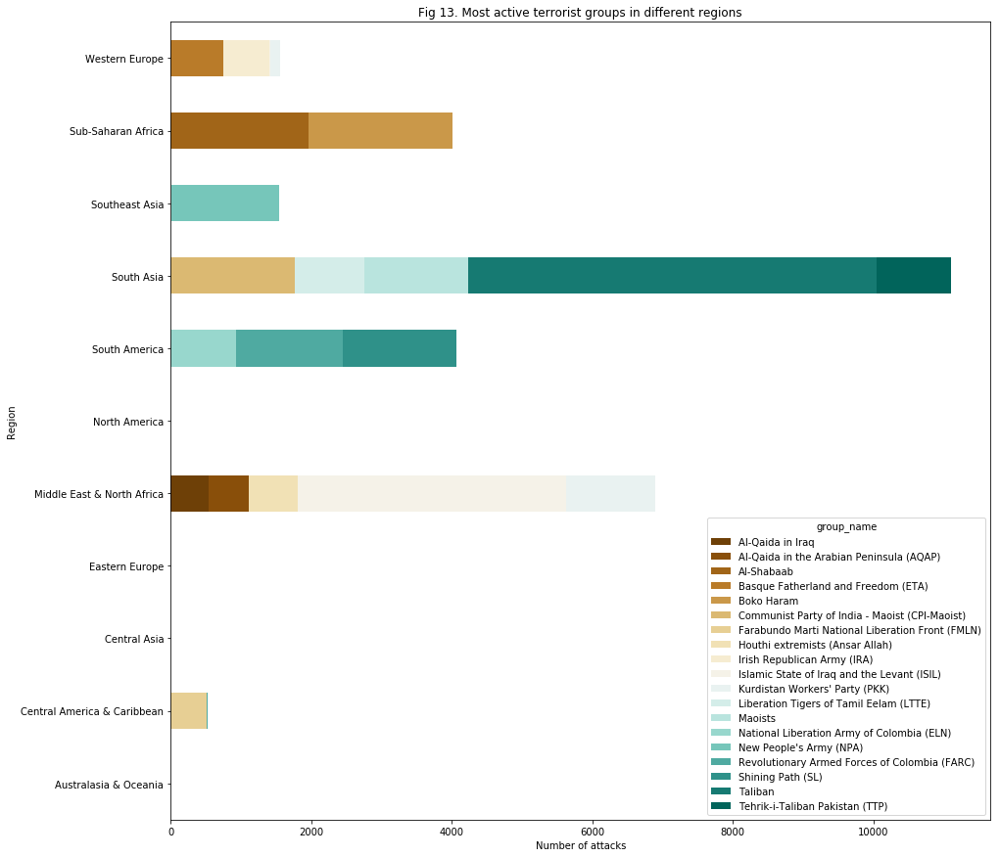

In [34]:
# Plotting stack diagram
terrorist_groups = df[df.group_name.isin(df.group_name.value_counts()[1:20].index)]
pd.crosstab(terrorist_groups.region,terrorist_groups.group_name).plot.barh(stacked = True,
                                                                           color = sns.color_palette("BrBG", 20))
fig = plt.gcf()

# Selecting figure size
fig.set_size_inches(15,15)

# Setting title and labels
plt.title("Fig 13. Most active terrorist groups in different regions")
plt.xlabel("Number of attacks")
plt.ylabel("Region")
plt.show()

**Fig 13.** gives the following information-
1. Al-Shabaab is the most active group in Western Europe.
1. ISIL is the most active group in Middle East & North Africa, followed by PKK.
1. Most of the terrorist attacks in South Asia are organized by the Taliban.
1. Al-Qaida carries out most of its attacks on Sub-Saharan Africa.

#### d) Number of casualities and deaths

In [73]:
casuality = df.loc[:,'casualities']
region = df.loc[:,'region']

# Creating pivot table
region_casualities = pd.concat([region,casuality],axis = 1).pivot_table(columns='region', values='casualities', aggfunc='sum')
region_casualities 

region,Australasia & Oceania,Central America & Caribbean,Central Asia,East Asia,Eastern Europe,Middle East & North Africa,North America,South America,South Asia,Southeast Asia,Sub-Saharan Africa,Western Europe
casualities,162.0,2760.0,2333.0,9500.0,13752.0,261052.0,23142.0,20505.0,185343.0,24929.0,77099.0,11014.0


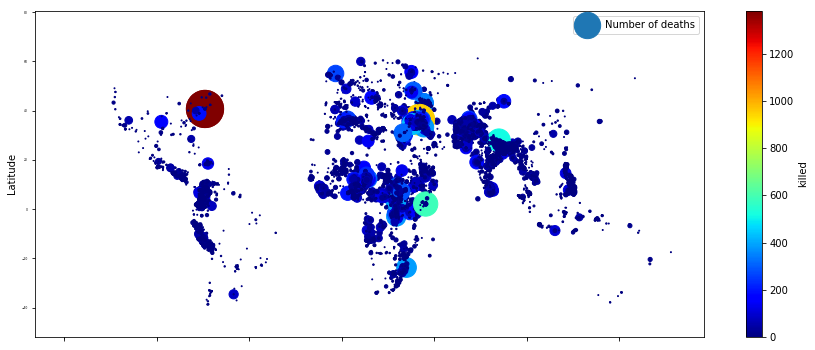

In [105]:
df.plot(kind= 'scatter', x='longitude', y='latitude', alpha=1.0,  figsize=(15,6),  
               s=df['killed'], label= 'Number of deaths', fontsize=3, c='killed', cmap=plt.get_cmap("jet"), colorbar=True)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.savefig("Deaths count.png")
plt.show()

### 2.3 Country-wise terrorist attack analysis

This section analyses information obtained from the data with respect to countries with a main focus on Iraq since it is the only country which has been facing maximum number of attacks almost every year.

#### Countries with highest attacks

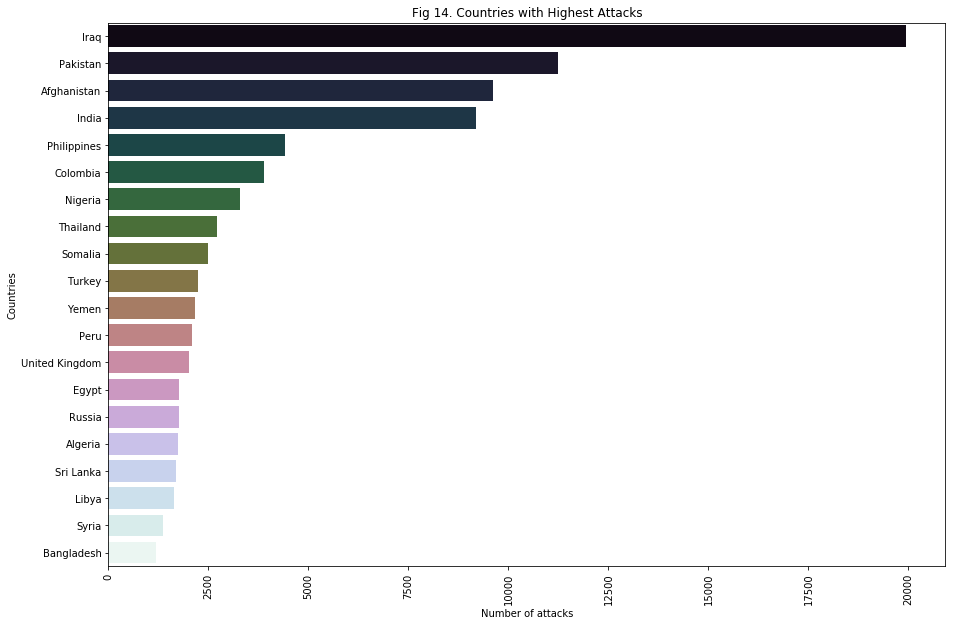

In [35]:
# Selecting figure size
plt.subplots(figsize = (15,10))

# Plotting the bar graph for top 20 countries 
sns.barplot(df['country'].value_counts()[0:20].values,df['country'].value_counts()[0:20].index,palette = "cubehelix")
plt.xticks(rotation = 90)

# Setting title and labels
plt.title('Fig 14. Countries with Highest Attacks')
plt.xlabel('Number of attacks')
plt.ylabel('Countries')
plt.show()

**Fig 14.** depicts that among all the countries of Middle East & North Africa, Iraq has the highest number of attacks. After Iraq, countries of South Asia are the most common victims of terrorist attacks. These countries include Pakistan, Afghanistan and India. United Kingdom is ranked 13th among the most attacked nations of the world.

#### Attacking method for top targeted countries

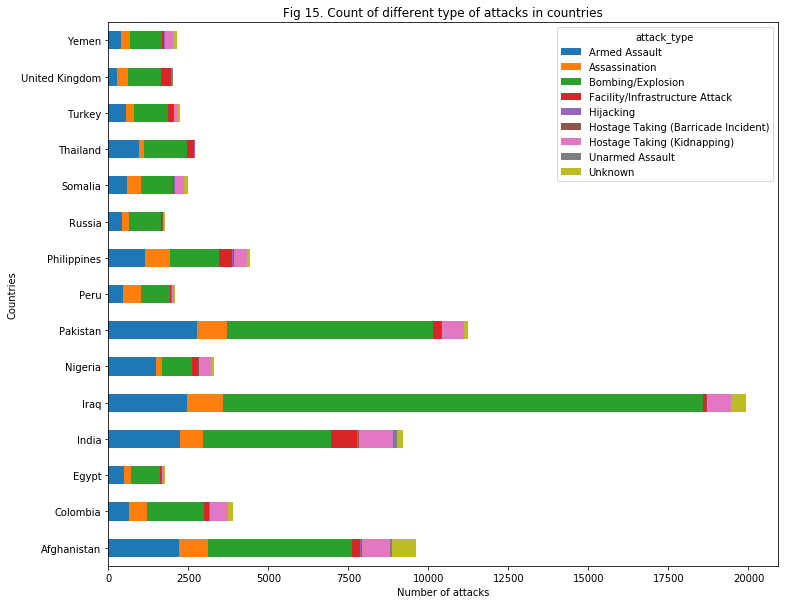

In [57]:
# Plotting stacked bar plot for type of attacks in different countries
terror_country = df[df['country'].isin(df['country'].value_counts()[0:15].index)]
pd.crosstab(terror_country.country,terror_country.attack_type).plot.barh(stacked = True)
fig = plt.gcf()

# Select figure size
fig.set_size_inches(12,10)

# Setting labels and titles
plt.title("Fig 15. Count of different type of attacks in countries")
plt.xlabel("Number of attacks")
plt.ylabel("Countries")
plt.show()

**Fig 15** depicts that bombing/explosion is used the most used attacking technnique in all the countries. 

### 2.3.1 Terrorist attack analysis - IRAQ

#### a) Number of terrorist attacks in Iraq every year

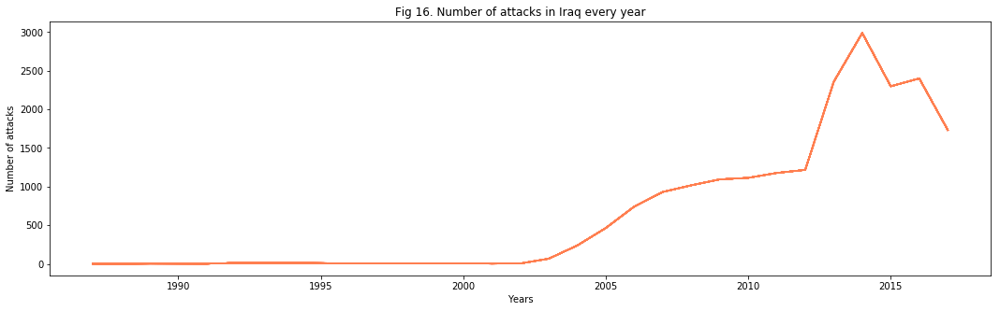

In [43]:
# Setting fiure size
plt.subplots(figsize = (18,5))

# Plotting bar graph for Iraq
terror_iraq = df[df['country'] == 'Iraq']
plt.plot(terror_iraq.groupby(['year']).count().index, terror_iraq.groupby(['year']).count(), color = 'coral')

# Setting title and labels
plt.title('Fig 16. Number of attacks in Iraq every year')
plt.xlabel("Years")
plt.ylabel("Number of attacks")
plt.show()

As we have now established that Iraq is the most attacked nation of the world, **Fig 16.** tells us that this was not always the case. Iraq had almost zero attacks till the year 2000. From the above graph we can see that the number attacks suddenly started increasing from the year 2000 and had even reached 3000 in the year 2014. However, we observe that there is a decline in the number of attacks in Iraq since 2014.  

#### b) Most attacked cities of Iraq

In [45]:
# Geting the cities of Iraq.
iraq_city=terror_iraq['city'].value_counts().index
iraq_city=terror_iraq[terror_iraq['city'].isin(iraq_city)]

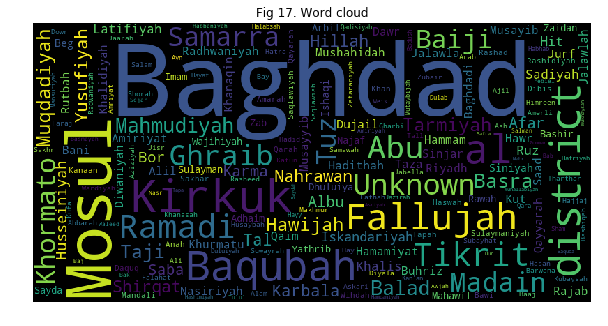

In [46]:
# Getting cities of Iraq
txt = iraq_city.city

# Generating word cloud
unique_string=(" ").join(txt)
wordcloud = WordCloud(width = 800, height = 400,collocations=False).generate(unique_string)
plt.figure(figsize=(10,10))
plt.imshow(wordcloud)

# Setting title
plt.title('Fig 17. Word cloud')
plt.savefig('Word cloud-Iraq.png')
plt.axis("off")
plt.show()
plt.close()

The most attacked city in iraq is Baghdad, followed by Mosul and Fallujah. 

#### c) Most active terrorist groups in Iraq

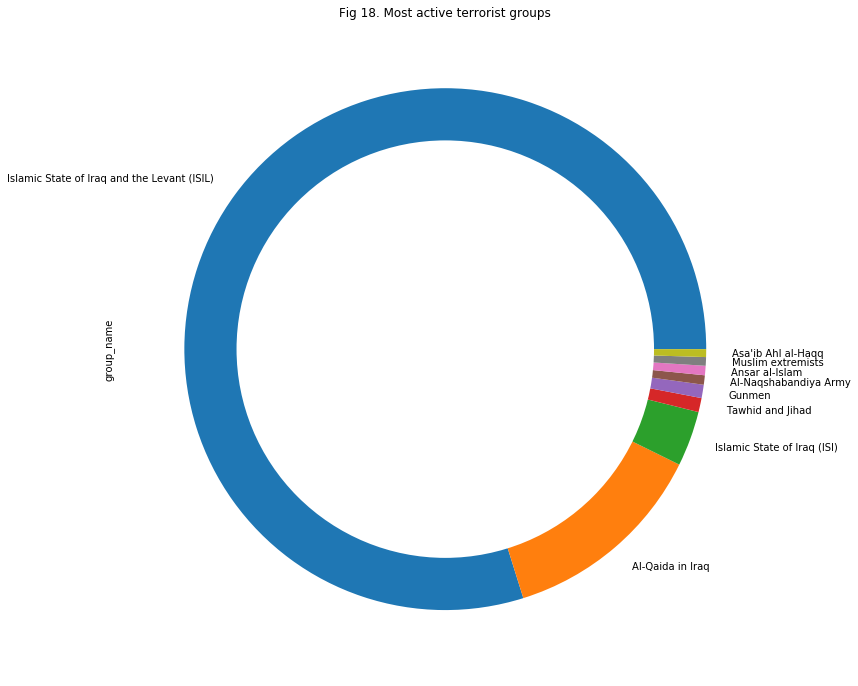

In [47]:
# Setting fiure size
plt.subplots(figsize=(12,12))

# Plotting pie chart.
terror_iraq.group_name.value_counts()[1:10].plot(kind='pie')

# Plotting donut chart
circle=plt.Circle(xy=(0,0), radius=0.8, facecolor='white')
plt.gca().add_artist(circle)

# Seting title
plt.title('Fig 18. Most active terrorist groups')
plt.show()

The above donut chart tells us that most of the attacks carried out in Iraq have been organised by the terrorist group ISIL. We had even observed in **Fig 13.** that ISIL is the most active group in Middle East & North Africa.  

#### d) Heatmap showing deaths due to terrorist attacks every year

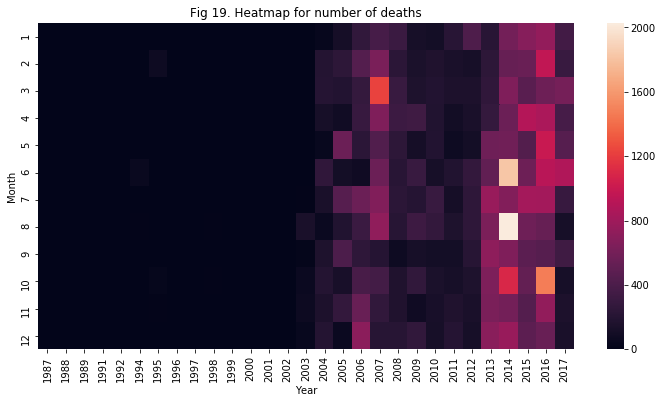

In [48]:
# Setting figure size
plt.subplots(figsize = (12,6))

# Getting months, years and number people killed in those months of the year
year_killed = df[df['country'] == "Iraq"].groupby(['year','month'])['killed'].sum()
year_killed = pd.DataFrame(year_killed)

year_killed.reset_index(inplace = True)
year_killed.columns = ['Year','Month','count']

year_killed = year_killed.pivot("Month","Year","count")
year_killed = year_killed.fillna(0)

# Constructing heatmap
sns.heatmap(year_killed)

# Setting title
plt.title('Fig 19. Heatmap for number of deaths')
plt.savefig("Heatmap.png")
plt.show()

**Fig 19** gives us an insight into the distribution of deaths in Iraq over the years. It can be seen that till the year 2001, there were no deaths in Iraq due to terrorist attacks. This was due to the fact that Iraq did not face any terrorist attacks till the 2000-2001. With the increase in number of terrorist attacks in Iraq, number of deaths also increased. We can observe that the number of deaths have incresed enormously since 2013. The year 2014 saw the highest number of deaths, especially in the months of August and June. 

#### e) Treeplot showing which groups are targeted by terrorists

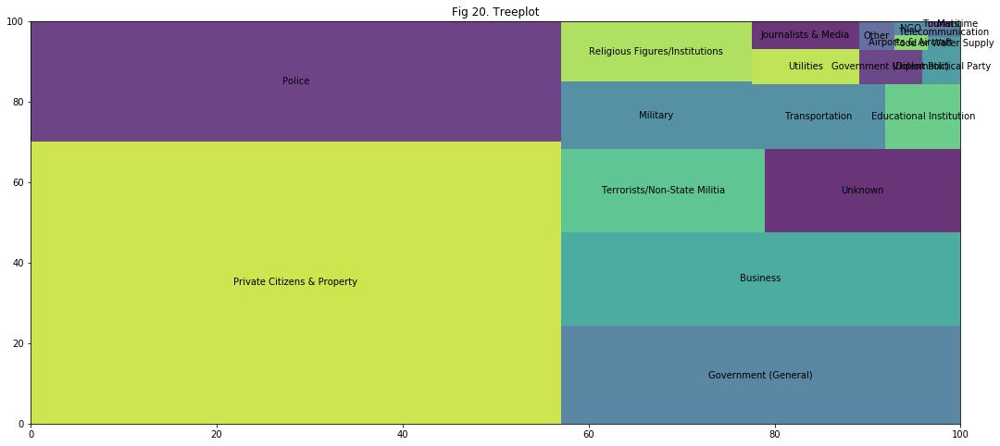

In [52]:
# Setting figure size
plt.subplots(figsize=(18,8))

# Selecting target_type for Iraq
targets = pd.DataFrame(df[df['country'] == 'Iraq']['target_type'].value_counts())
targets.reset_index(inplace = True)

# Plotting treeplot
squarify.plot(sizes = targets["target_type"],label = targets["index"],alpha = 0.8)

# Setting title
plt.title('Fig 20. Treeplot')
plt.show()

Private citizens & property is the most popular target of terrorists. This is followed by police, government and bisuness.

## 3. Predictive Analysis

This section aims at making predictions on whether a particular attack will be successful or not. I have used random forests model as they are typically more accurate than single decision trees.

#### 3.1 Train-Test split
First the columns are separated into dependent (success) and independent variables (month, day, extended, latitude, longitude, multiple, suicide, attacktype1, targtype1, weaptype1, killed).
Then the data is split into training set(80%) and testing set (20%). 

In [18]:
explanatory_variables = [ 'month', 'day', 'extended',  'latitude', 'longitude', 'multiple','suicide','attacktype1',
            'targtype1', 'weaptype1', 'killed']
y = df['success']
X = df[explanatory_variables]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

#### 3.2 Random Forest Method
In order to evauate the accuracy of Random Forest method, Confusion Matrix is used. 

Interpretation for the model is as follows:
1. TN = A non-successful attack is predicted correctly.
1. TP = A successful attack is predicted correctly.
1. FN = A successful attack is predicted as non-successful, which is a wrong prediction.
1. FP = A non-successful attack is predicted as successful, which is a wrong prediction.

Precision for -

success = TP/(TP+FP) 

not success = TN/(TN+FN) 

Recall for - 

success = TP/(TP+FN) 

not success = TN/(TN+FP) 

Harmonic mean of Precision and Recall = f1-score

In [58]:
clf = RandomForestClassifier(n_estimators=100) 
clf = clf.fit(X_train, y_train)
clf_pred = clf.predict(X_test)

After training, the accuracy of Random Forest method is calculated using actual and predicted values.


In [59]:
print("Accuracy:",metrics.accuracy_score(y_test, clf_pred))

Accuracy: 0.9238879126976787


In [60]:
print(classification_report(y_test,clf_pred))


              precision    recall  f1-score   support

           0       0.77      0.48      0.59      2487
           1       0.94      0.98      0.96     19139

   micro avg       0.92      0.92      0.92     21626
   macro avg       0.85      0.73      0.78     21626
weighted avg       0.92      0.92      0.92     21626



In [61]:
print(confusion_matrix(y_test,clf_pred))


[[ 1202  1285]
 [  361 18778]]


#### 3.3 Checking for significant features 

In [26]:
for name, score in zip(X_train[explanatory_variables], clf.feature_importances_):
    print(name,score)

month 0.08645872845138547
day 0.12816261848683413
extended 0.0061274960156887616
latitude 0.17120440347383417
longitude 0.16883777920452142
multiple 0.010482229203622469
suicide 0.013224565313378407
attacktype1 0.12247145540798905
targtype1 0.16199708580826086
weaptype1 0.026142519974462094
killed 0.10489111866002311


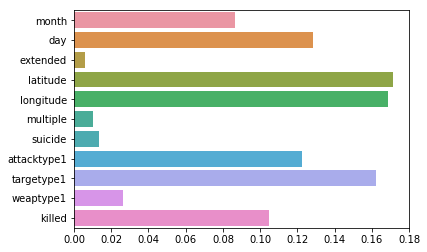

In [28]:
name = ['month','day','extended','latitude','longitude','multiple','suicide','attacktype1',
        'targetype1','weaptype1','killed']
score = [0.08645872845138547,0.12816261848683413,0.0061274960156887616,0.17120440347383417,0.16883777920452142,
         0.010482229203622469,0.013224565313378407,0.12247145540798905,0.16199708580826086, 0.026142519974462094,
         0.10489111866002311]
sns.barplot(score,name)

It can be observed that features like extended, multiple and suicide are least important in predicting the success of an attack. So we can decide to drop these features.

## 4. Twitter Data Analysis

This section analyses the live twitter data on Global Terrorism. The aim of this part of the project is to see how the world is reacting to global terrorism.
This section contains two parts - 
1. Word cloud of tweets which represents the most used words related to global terrorism.
1. Basemap that represents which regions of the world have the most tweets about global terrorism.

**[NOTE: The code for basemap is in myMap.py file]**

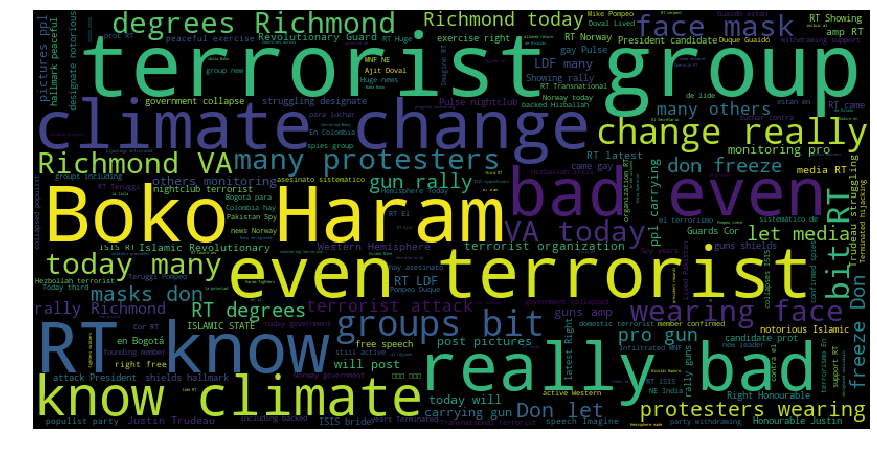

In [103]:
# Getting tweets texts
txt = tweet_txt

# Generating word cloud
unique_string=(" ").join(txt)
wordcloud = WordCloud(width = 800, height = 400).generate(unique_string)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.savefig("Latest tweets.png")
plt.show()
plt.close()

The most talked about topics are Boko Haram and climate change at present. 
 
Boko Haram is a militant Islamic group working out of Nigeria and their purpose is to institute Sharia, or Islamic law. They have been causing many violent attacks in Nigeria for the last few days, which include killing of pastor, student, soldiers and cutting off the city of Maiduguri from electricity supply from the national grid.

The above word cloud also tells us that people have started speaking about the crimes against our environment along with the crimes against humans. It can be seen that the words that were traditionally being used for terrorist attacks are now being used for climate change, as people believe that climate change is as frightening as global terrorism.

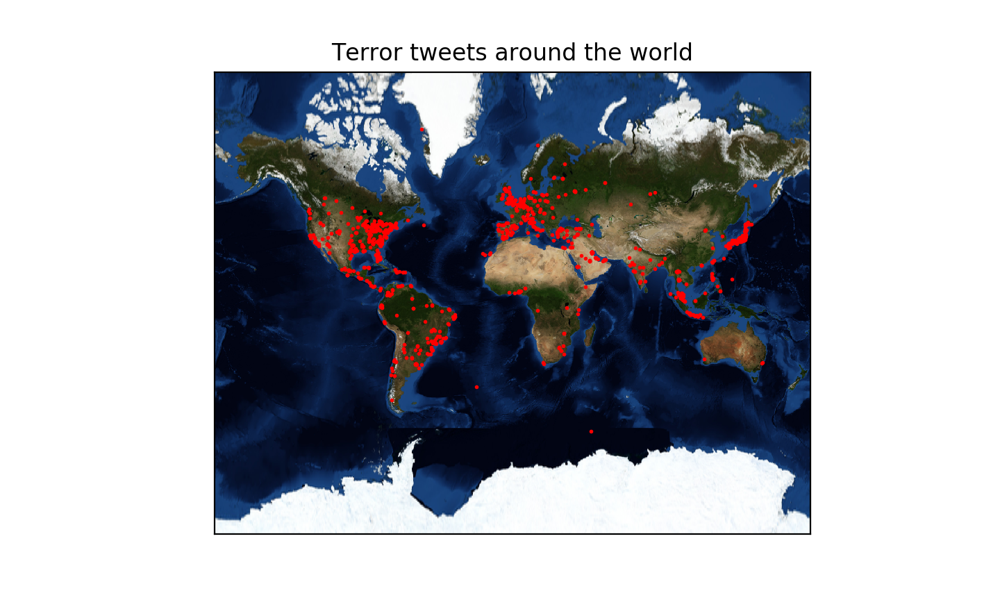

In [62]:
from IPython.display import Image
Image(filename = 'Figure_1.png', width = 800, height = 400)

From the above map it is observed that people from North America and Europe are talking about terrorism the most on social media than the rest of the world. Some of the reasons behind the fact that other regions of the world are not tweeting a lot about global terrorism are as follows- 
1. Only 13.5% of the African population has internet access.
1. Similarly, major population of developing countries in Asia like Bangladesh, Pakistan and Afghanistan don't have access to internet.
1. The majority of nations in Asia censor the internet media, including Bahrain, Egypt, Iran, Saudi Arabia, Syria, North Korea, Pakistan, China, Turkey, the United Arab Emirates, and Turkmenistan.
1. People in the above countries don't have the freedom to post about sensitive issues on social media.


## Conclusion

From the above analysis it is observed that there is a rising trend in terrorist activities since 2000s. Terrorist attacks have led to the deaths of 258,067 people around the globe in the last 30 years. Taliban, ISIS and Boko Haram have emerged to be very lethal terrorist groups in the recent years. They tend to attack the private citizens and property, government and police, through bombing/explosions and armed assaults. It is also seen in our analysis that suicide attack has become common only in the last 15 years and was almost nill before that. 

Middle-East & North Africa and Southern-Asia are the regions with highest terrrorist attacks as well as casualities.
Iraq, Pakistan, Afghanistan and India are among the highly attacked countries of the world. Iraq has witnessed the maximum number of attacks in the world by ISIS. This has caused thousands of deaths every year in the cities of Iraq like Baghdad and Mosul. 

From the twitter data analysis it can be concluded that developed nations of North America and Europe have been tweeting about Boko Haram and Climate Change the most, as they have become one of the most serious and concerning issues in the recent days.


## References

Display real-time tweets on a map with Basemap and Tweepy(2015). Caraccio,Michael. Retrieved from https://piratefache-ch.cdn.ampproject.org/v/s/piratefache.ch/display-real-time-tweets-on-a-map-with-basemap-and-tweepy/amp/?usqp=mq331AQCKAE%3D&amp_js_v=0.1

Understanding Random Forests Classifiers in Python(2018). Navlani,Avinash. Retrieved from https://www.datacamp.com/community/tutorials/random-forests-classifier-python

How to remove hashtag, @user, link of a tweet using regular expression(2016).xecgr. Retrieved from https://stackoverflow.com/questions/8376691/how-to-remove-hashtag-user-link-of-a-tweet-using-regular-expression